In [3]:
import numpy as np
import math
import matplotlib.pyplot as plt

import torch
import torch.nn as nn 
import torch.nn.functional as F

from matplotlib.animation import FuncAnimation
from IPython.display import HTML

dtype  = torch.float32
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

This jupyter notebook can be found here: [https://github.com/cagatayyildiz/pca-ae-vae-diffmodels](https://github.com/cagatayyildiz/pca-ae-vae-diffmodels).

# 0. References

This presentation contains many ideas, re-phrased sentences and screenshots from the following resources, particularly the first two:

- [Denoising Diffusion-based Generative Modeling tutorial (CVPR 2022)](https://cvpr2022-tutorial-diffusion-models.github.io/)
- [Taylan Cemgil's notes](https://www.cmpe.boun.edu.tr/~cemgil/)
- [Deep Unsupervised Learning using Nonequilibrium Thermodynamics](https://arxiv.org/pdf/1503.03585.pdf)
- [Denoising Diffusion Probabilistic Models (DDPM) ](https://arxiv.org/pdf/2006.11239.pdf)
- [What Regularized Auto-Encoders Learn from the Data Generating Distribution](https://arxiv.org/pdf/1211.4246.pdf)

# 1. Diffusion models

The main idea behind diffusion models is the following:

![](figs/diff1.png)

**Forward model:** Here, we first implement a forward model $q(x_t | x_{t-1})$ that transforms samples from data distribution into a noise distribution.
The process is Markovian.
Later, we will specify the hyperparameters involved in this process.

**Backward model:** Inverting the forward model lets us generate samples from the initial data distributions.
This can be done by learning a neural network that inverts the forward step, thereby denoises.

$\newcommand{\E}[2][]{
  \mathbb{E}_{#1}\left[ #2 \right]
}$
$\newcommand{\N}{\mathcal{N}}$
$\newcommand{\hb}[3]{
	\frac
		{\textrm{d}^{#1}{#2}}
		{\textrm{d}{#3}}
}$ 

## 1.1. Forward model

![](figs/diff2.png)

### 1.1.1. Diffusion example with fixed updates

Given a dataset

$$ \mathcal{D} = \{x_0^{(1)}, x_0^{(2)}, \dots, x_0^{(N)}\},$$ 

we consider an empirical data distribution:

$$ \pi(x_0) = \frac{1}{N}\sum_{i=1}^{N} \delta(x_0 - x_0^{(i)}).$$

Diffusion models start from an initial realization $x_0$ from an empirical data distribution $\pi(x_0)$.
Then, they iteratively rescale by a factor $0 < a < 1$ and add noise $\epsilon_t \sim \N(0, 1)$ at each step:

\begin{align}
x_0 & \sim \pi(x_0) \\
t & = 1,2,\dots \\
x_t & = a x_{t-1} + \sigma \epsilon_t.
\end{align}

Here, $x_0$ has a Dirac mass, meaning that $x_1$ would follow a Gaussian distribution. 
Since Gaussians are closed under linear operations, all $x_i$ stays Gaussian.
Let's see how the flow goes on:

\begin{align}
x_1 & = a x_{0} + \sigma \epsilon_1 \\
x_2 & = a (a x_{0} + \sigma \epsilon_1) + \sigma \epsilon_2 = a^2 x_{0} + a\sigma \epsilon_1 + \sigma \epsilon_2\\
x_3 & = a (a (a x_{0} + \sigma \epsilon_1) + \sigma \epsilon_2) + \sigma \epsilon_3 = a^3 x_{0} + a^2 \sigma \epsilon_1 + a \sigma \epsilon_2 + \sigma \epsilon_3\\
\dots \\
x_t & = a^t x_{0} + \sigma(a^{t-1} \epsilon_1 + a^{t-2} \epsilon_2 + \dots + a  \epsilon_{t-1} + \epsilon_t).
\end{align}

Next, we compute the statistics of $x_t$. 
Conveniently, we have a closed form expression for the mean of $x_t$:

\begin{align}
\E[\epsilon]{x_t|x_0} & = a^t x_{0}.
\end{align}

To compute the variance, we first note

\begin{align}
x_t - \E{x_t|x_0} & = \sigma(a^{t-1} \epsilon_1 + a^{t-2} \epsilon_2 + \dots + a  \epsilon_{t-1} + \epsilon_t).
\end{align}

Next, we look at the square

\begin{align}
  \left(x_t - \E{x_t|x_0} \right)^2 & = \sigma^2 \left( \sum_{i=1}^t(a^{t-i})^2\epsilon_i^2 + \sum_{i,j=1}^t (a^{2t-i-j})\epsilon_i\epsilon_j \right)
\end{align}

Noting that

$$\E{\epsilon_t^2} = 1 \quad\text{and}\quad \E{\epsilon_t \epsilon_\tau } = 0, ~ t \neq \tau,
$$

the expectation becomes

\begin{align}
\E{(x_t - \E{x_t|x_0})^2} & = \sigma^2 \sum_{i=0}^{t-1}(a^2)^i = \frac{\sigma^2(1 - a^{2t})}{1 - a^2}.
\end{align}

When we choose $a = \sqrt{1 - \sigma^2}$ we obtain $\sigma^2 = 1 - a^2$ and henceforth

$$q(x_t| x_0) = \N(a^t x_{0}, 1 - a^{2t}).$$

Obviously, for large $t$, the flow converges to an isotropic Gaussian:

$$q(x_t|x_0) \rightarrow \N(0, 1).$$


### 1.1.2. Diffusion with varying update factors

Next, we look into the case where the update factor depends on time.
Let's add Gaussian noise to the data according to a variance schedule $\beta_1, \ldots, \beta_T$:

\begin{align}
x_0 & \sim \pi(x_0) \\
t & = 1,2,\dots \\
x_t & = \sqrt{1-\beta_t} x_{t-1} + \sqrt{\beta_t} \epsilon_t.
\end{align}
<!-- x_t & \sim \mathcal{N}(x_t; \sqrt{\alpha_t} x_{t-1}, \beta_t) -->

Notice that $\beta_t: 0 → 1$ interpolates between a constant Markov chain to white noise.
For notational convenience, we define

\begin{align}
  \alpha_t &= 1 - \beta_t \quad \text{and} \quad \bar{\alpha}_t = \prod_{i=1}^t \alpha_i.
\end{align}

We have 

\begin{align}
x_1 & = \sqrt{\alpha_1} x_{0} + \sqrt{1 - \alpha_1} \epsilon_1 \\
x_2 & = \sqrt{\alpha_2} (\sqrt{\alpha_1} x_{0} + \sqrt{1 - \alpha_1} \epsilon_1) + \sqrt{1 - \alpha_2} \epsilon_2 = \sqrt{\bar{\alpha}_2} x_{0} + \sqrt{\alpha_2} \sqrt{1 - \alpha_1} \epsilon_1 + \sqrt{1 - \alpha_2}\epsilon_2\\
x_3 & =  \sqrt{\bar{\alpha}_3} x_{0} + \sqrt{\alpha_3}\sqrt{\alpha_2} \sqrt{1 - \alpha_1} \epsilon_1 + \sqrt{\alpha_3} \sqrt{1 - \alpha_2}\epsilon_2 + \sqrt{1 - \alpha_3}\epsilon_3\\
\dots \\
x_t & = \sqrt{\bar{\alpha}_t} x_{0} + \frac{\sqrt{\bar{\alpha}_t}}{\sqrt{\bar{\alpha}_1}} \sqrt{1 - \alpha_1} \epsilon_1 + \frac{\sqrt{\bar{\alpha}_t}}{\sqrt{\bar{\alpha}_2}} \sqrt{1 - \alpha_2} \epsilon_2  + \dots + \frac{\sqrt{\bar{\alpha}_t}}{\sqrt{\bar{\alpha}_{t-1}}} \sqrt{1 - \alpha_{t-1}} \epsilon_{t-1} + \sqrt{1 - \alpha_{t}} \epsilon_{t} \\
& = \sqrt{\bar{\alpha}_t} x_{0} + \sqrt{\bar{\alpha}_t} \left(\sqrt{\frac{1 - \alpha_1}{\bar{\alpha}_1} } \epsilon_1 
+  \sqrt{\frac{1 - \alpha_2}{\bar{\alpha}_2}} \epsilon_2  
+ \dots 
+  \sqrt{\frac{1 - \alpha_{t-1}}{\bar{\alpha}_{t-1}}} \epsilon_{t-1} 
+ \sqrt{\frac{1 - \alpha_{t}}{\bar{\alpha}_{t}}} \epsilon_{t} \right).
\end{align}

As above, the expectation of a future state $x_t$ conditioned on the initial state $x_0$ has a simple form:

$$\E{x_t| x_0} =  \sqrt{\bar{\alpha}_t} x_{0}.$$

Then we look at the variance of $x_t$.

\begin{align}
\E{(x_t - \E{x_t|x_0})^2} & = {\bar{\alpha}_t} \left({\frac{1 - \alpha_1}{\bar{\alpha}_1} } 
+  {\frac{1 - \alpha_2}{\bar{\alpha}_2}}   
+  {\frac{1 - \alpha_3}{\bar{\alpha}_3}} 
+ \dots 
+  {\frac{1 - \alpha_{t-1}}{\bar{\alpha}_{t-1}}}  
+ {\frac{1 - \alpha_{t}}{\bar{\alpha}_{t}}}  \right) \\
& = {\bar{\alpha}_t} \left({\frac{\alpha_2 - \alpha_1 \alpha_2}{\bar{\alpha}_1 \alpha_2} } 
+  {\frac{1 - \alpha_2}{\bar{\alpha}_2}}  
+  {\frac{1 - \alpha_3}{\bar{\alpha}_3}}  
+ \dots 
+  {\frac{1 - \alpha_{t-1}}{\bar{\alpha}_{t-1}}}  
+ {\frac{1 - \alpha_{t}}{\bar{\alpha}_{t}}}  \right), \quad \text{note}~ \bar{\alpha}_{t} = \alpha_t \bar{\alpha}_{t-1} \\
& = {\bar{\alpha}_t} \left({\frac{1 - \alpha_1 \alpha_2}{\bar{\alpha}_2}}  
+  {\frac{1 - \alpha_3}{\bar{\alpha}_3}}  
+ \dots 
+  {\frac{1 - \alpha_{t-1}}{\bar{\alpha}_{t-1}}}  
+ {\frac{1 - \alpha_{t}}{\bar{\alpha}_{t}}}  \right) \\
& = {\bar{\alpha}_t} \left({\frac{1 - \bar{\alpha}_3}{\bar{\alpha}_3}}  
+ \dots 
+  {\frac{1 - \alpha_{t-1}}{\bar{\alpha}_{t-1}}}  
+ {\frac{1 - \alpha_{t}}{\bar{\alpha}_{t}}}  \right) = 1 - \bar{\alpha}_t \\
& = {\bar{\alpha}_t} \left( {\frac{1 - \bar{\alpha}_{t}}{\bar{\alpha}_{t}}}  \right) = 1 - \bar{\alpha}_t.
\end{align}

Consequently we obtain the following distribution for future states $x_t$: 

$$q(x_t|x_0) = \N(x_t; \sqrt{\bar{\alpha}_t} x_{0}, 1 - \bar{\alpha}_t).$$

Notice that our previous observation ($\beta_t: 0 → 1$ interpolates between a constant Markov chain to white noise) still holds as $\beta_t: 0 → 1$ implies $\alpha_t: 1 → 0$.

### 1.1.3. An example diffusion 

In the following example, we have a very simple dataset with 4 data points:

$$ \mathcal{D} = \{-15, -5, 1, 10\}.$$ 


#### Flow demonstration

Now we check that $q_t(x_t)$ looks like. 
Below, we visualize $q_t(x_t)$ over time $t$.
For each initial value (the dataset), we simulate the Markov chain 25 times.
Also, notice that since we have 4 initial values (data points), $q_t(x_t)$ is a Gaussian mixture with 4 components.

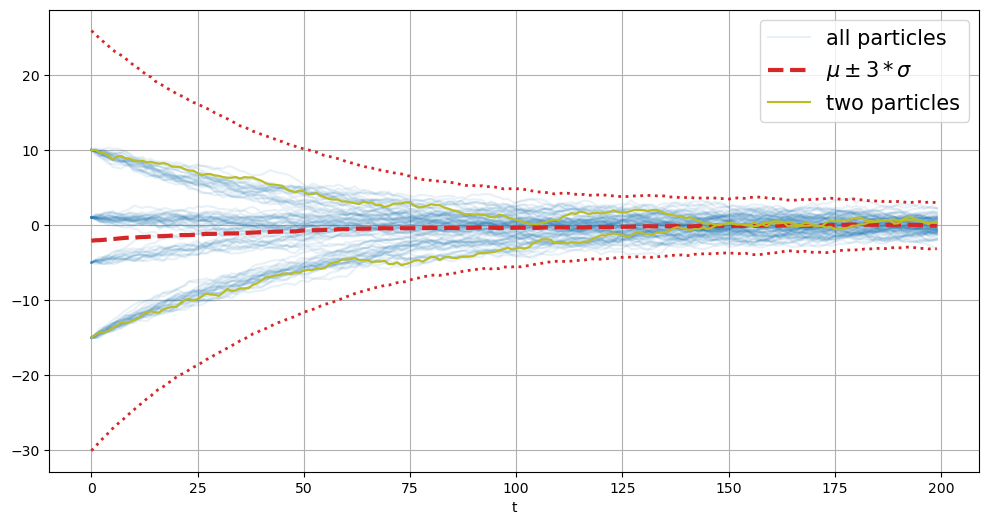

In [45]:
mu_0 = [1, -5, -15, 10]
# mu_0 = range(-10,10)
def sample_prior(num_samples, sig_pri=0):
    x = np.random.choice(mu_0, size=(num_samples,))
    samples = x + sig_pri * np.random.randn(num_samples)
    return torch.tensor(samples,dtype=dtype,device=device)


N   = 100 # Number of samples
T   = 200 # Number of time steps

sig    = 0.2 # reverse process noise
betas  = np.ones(T) * sig**2 # fixed noise parameter
alphas = 1 - betas # see above definitions <---> a^2+b=1
alpha_bars = torch.tensor(np.cumprod(alphas),dtype=dtype,device=device)
    
# particles to be flown
X = torch.zeros(N, T)
X[:, 0] = sample_prior(N)

# run the chain forward
for t in range(T-1):
    X[:, t+1] = np.sqrt(1-betas[t]) * X[:, t] + np.sqrt(betas[t])*np.random.randn(N)

# visualize
plt.figure(1,(12,6))
p1 = plt.plot(X.T, 'tab:blue', alpha=0.1, label='all particles')

std = X.std(0)
m   = X.mean(0)
p2 = plt.plot(m, '--', color='tab:red', lw=3, label='$\mu \pm 3*\sigma$')
plt.plot(m + 3*std, ':', color='tab:red', lw=2)
plt.plot(m - 3*std, ':', color='tab:red', lw=2)

p3 = plt.plot(X[0:2, :].T, 'tab:olive', label='two particles')
plt.xlabel('t')
plt.legend(handles=[p1[0],p2[0],p3[0]], fontsize=15)
plt.grid()
plt.show()

#### Time marginals
Next, we implement the code needed to compute marginal densities $q_t(x_t)$.

In [44]:
# time marginals 
def gaussian_pdf(x, mu, sig2):
    if sig2 == 0:
        sig2 = 1e-5
    return torch.exp(-0.5*(x - mu)**2/sig2) / np.sqrt(2*np.pi*sig2)

# computes the density q_t at time t given initial value(s) x_0
def marginal(x_0, a_bar_t):
    mu = np.sqrt(a_bar_t) * x_0
    v  = (1-a_bar_t) * torch.ones_like(mu)
    return mu, v


def eval_mixture_density(mu, v, x_grid):
    ''' Evaluates the density of each x in x_grid under N Gaussian mixtures
    mu  - [N]
    var - [N]
    x_grid - [M]
    '''
    # version-1: loop over mixture components induced by the particles
    # p = np.zeros_like(x_grid)
    # for i in range(len(mu)):
    #   p = p + gaussian_pdf(x_grid, mu[i], v[i])
    # return p/len(mu)
    # version-2: one-shot
    if v[0] == 0:
        v += 1e-10
    N,M = len(mu),len(x_grid)
    x_grid = torch.stack([x_grid]*N) # N,M
    v,mu = v.reshape(N,1), mu.reshape(N,1)
    dens = torch.exp(-0.5*(x_grid - mu)**2/v) / (2*np.pi*v).sqrt() # N,M
    return dens.mean(0)

x_grid = torch.linspace(-16, 16, 3201) 
q_ts   = torch.zeros(T,len(x_grid))

for t in range(T):
    marg_mu, marg_var = marginal(X[:, 0], alpha_bars[t]) # one Gausssian per particle
    q_ts[t] = eval_mixture_density(marg_mu, marg_var, x_grid) # Ngrid

#### Density animation
Next, we visualize a histogram of simulated particles $q_t(x_t)$ over time $t$.

In [51]:
PLOT_EVERY = T//100
fig, ax = plt.subplots()
ax.set_xlabel('x')
ax.set_title(f'time = {0}')

def animate(t):
    ax.cla()
    t_plot = t*PLOT_EVERY
    ax.set_title(f'time = {t_plot}')
    ax.set_xlabel('x')
    ax.hist(X[:, t_plot].numpy(), 10, density=True, alpha=0.4)
    ax.plot(x_grid, q_ts[t_plot])
    if t>0:
        ax.set_ylim([0, 0.5])
    return ax

anim = FuncAnimation(fig, animate, frames=T//PLOT_EVERY, interval=50)
plt.close()
HTML(anim.to_jshtml())

#### Density and particles over time
Next, we visualize the density $q_t$ using contourplots.

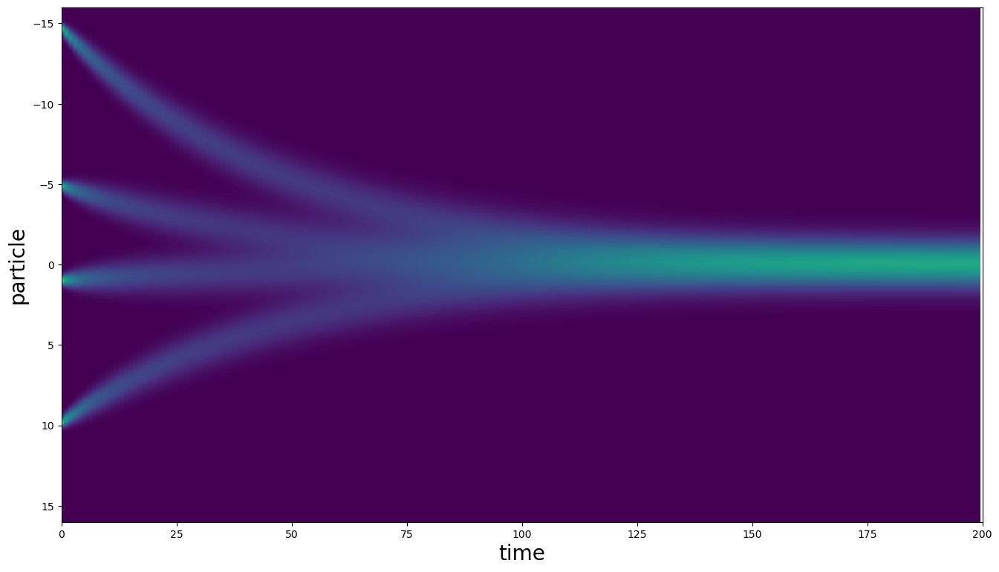

In [52]:
PLOT_EVERY = T//50

real_x = np.arange(0,T)
real_y = x_grid

dx = (real_x[1]-real_x[0])/2.
dy = (real_y[1]-real_y[0])/2.
extent = [real_x[0]-dx, real_x[-1]+dx, real_y[-1]+dy, real_y[0]-dy]

fig, ax = plt.subplots(figsize=(16,9))
ax.imshow(q_ts[0:], extent=extent)
ax.imshow(q_ts[0:].T, extent=extent, aspect='auto', vmin=0.0, vmax=0.66)
parts = ax.plot(X[14:18, 0:1].T, 'tab:olive', label='two particles')
ax.set_xlabel('time',fontsize=20)
ax.set_ylabel('particle',fontsize=20)
ax.set_xlim([0,T])
# ax.colorbar()

def animate(t):
    t_plot = t*PLOT_EVERY
    # ax.plot(x[14:18, 0:t_plot].T, 'tab:olive', label='two particles')
    for i,part in enumerate(parts):
        part.set_xdata(np.arange(t_plot))
        part.set_ydata(X[14+i, 0:t_plot])

plt.show()
plt.close()
anim = FuncAnimation(fig, animate, frames=T//PLOT_EVERY, interval=50)
HTML(anim.to_jshtml())

## 1.2. Inverting the forward diffusion

![](figs/diff3.png)

The key idea of a diffusion models is instead of directly sampling from $q(x_0)$, sampling from an alternative model $p(x_0)$ using a time reversed 
model $  p(x_T) p(x_{T-1}| x_T)  \dots  p(x_1| x_2) p(x_0|x_1)$ where
$p(x_T) = \mathcal{N}(0, I)$.

\begin{align}
x_T & \sim \mathcal{N}(0, I) \\
t & = T-1,T-2,\dots, 1 \\
x_t & \sim p(x_{t}| x_{t+1}).
\end{align}

### 1.2.1. The evidence lower bound
This derivation is based on the DDPM paper.
As usual, for the empirical data distribution, $q(x_0)\equiv\pi(x_0)$ we would like to maximize the data log-likelihood

$$ \E[q(x_0)]{\log p(x_0)}. $$

We first write down a bound on the marginal log-likelihood

\begin{align}
\log p(x_0) &= \log \int p(x_{0:T}) d x_{1:T} \\ 
&= \log \int p(x_{0:T}) \frac{q(x_{1:T}|x_0)}{q(x_{1:T}|x_0)} d x_{1:T} \\ 
&= \log \int q(x_{1:T}|x_0) \frac{p(x_{0:T})}{q(x_{1:T}|x_0)} d x_{1:T} \\ 
&= \log \E[q(x_{1:T}|x_0)]{\frac{p(x_{0:T})}{q(x_{1:T}|x_0)}} \\
&\geq \E[q(x_{1:T}|x_0)]{\log \frac{p(x_{0:T})}{q(x_{1:T}|x_0)}} \\
&= \E[q(x_{1:T}|x_0)]{\log \left( p(x_T) \prod_t \frac{p(x_{t-1}|x_t)}{q(x_t|x_{t-1},x_0)}} \right) \\
&= \E[q(x_T|x_0)]{\log p(x_T)} + \sum_t \E[q(x_{1:T}|x_0)]{\frac{p(x_{t-1}|x_t)}{q(x_t|x_{t-1},x_0)}}  \\
&= \E[q(x_T|x_0)]{\log p(x_T)} + \sum_t \E[\;pgq(x_{1:T}|x_0)]{\log \frac{p(x_{t-1}|x_t)}{q(x_{t-1}|x_t,x_0)\frac{q(x_t|x_0)}{q(x_{t-1}|x_0)} }}  \\
&= \E[q(x_T|x_0)]{\log p(x_T)} + \sum_t \E[q(x_{1:T}|x_0)]{\log \frac{p(x_{t-1}|x_t)}{q(x_{t-1}|x_t,x_0)}\frac{q(x_{t-1}|x_0)}{q(x_t|x_0)}}  \\
&= \E[q(x_T|x_0)]{\log p(x_T)} + \sum_t \E[q(x_{1:T}|x_0)]{\log \frac{p(x_{t-1}|x_t)}{q(x_{t-1}|x_t,x_0)}} + \sum_t \E[q(x_{1:T}|x_0)]{\log \frac{q(x_{t-1}|x_0)}{q(x_t|x_0)}}  \\
&= \E[q(x_T|x_0)]{\log p(x_T)} - \sum_t \text{KL}\left[q(x_{t-1}|x_t,x_0) \| p(x_{t-1}|x_t) \right]  + \E[q(x_1|x_0)]{\log q(x_1|x_0)} - \E[q(x_T|x_0)]{\log q(x_T|x_0)}.
\end{align}


Maximizing the lower bound imply minimizing the KL divergence.
In other words, the backward model $p(x_{t-1}|x_t)$ approximates the posterior $q(x_{t-1}|x_t,x_0)$ of the forward model.
We first write down the posterior:

\begin{align}
  q(x_{t-1}|x_t,x_0) &= \N(x_{t-1};\bar{\mu}(x_t,x_0),\bar{\beta}_t) \\
  \bar{\mu}(x_t,x_0) &= \frac{\sqrt{\bar{\alpha}_{t-1}}\beta_t}{1-\bar{\alpha}_t}x_0 + \frac{\sqrt{\alpha_t}(1-\bar{\alpha}_{t-1})}{1-\bar{\alpha}_t}x_t \\
  \bar{\beta}_t &= \frac{1-\bar{\alpha}_{t-1}}{1-\bar{\alpha}_{t}}\beta_t.
\end{align}

To minimize the KL, the mean of the backward flow $\mu_\theta(x_t,t)$ should match the above mean:

\begin{align}
  \min_\theta ~~ \E[x_0,\epsilon] {\| \bar{\mu}(x_t,x_0) - \mu_\theta(x_t,t) \|}.
\end{align}

Next, we plug in the forward state

$$ x_t = \sqrt{\bar{\alpha}_t} x_{0} + \epsilon (1 - \bar{\alpha}_t), \quad \epsilon \sim \N(0,1), $$

which gives

\begin{align}
  \min_\theta ~~ & \E[x_0,\epsilon]{\Big\| \bar{\mu}\left(x_t, \frac{x_t -  \epsilon (1 - \bar{\alpha}_t)}{\sqrt{\bar{\alpha}_t} } \right) - \mu_\theta(x_t,t) \Big\|} \\
  \min_\theta ~~ & \E[x_0,\epsilon]{\Big\| \frac{1}{\sqrt{\alpha}} \left( x_t - \frac{\beta_t}{\sqrt{1-\bar{\alpha}_t}}\epsilon \right) - \mu_\theta(x_t,t) \Big\|}.
\end{align}

That means, the mean function $\mu_\theta(x_t,t)$ should predict a function of known terms, $x_t$ and also noise $\epsilon$.
This is why it performs denoising.
After re-parameterizing above loss, the following becomes the optimization objective:

![ddpm.png](figs/ddpm.png)

Next, let's implement a routine for learning $\epsilon_\theta$ above.

In [55]:
x0 = torch.tensor(X[:,0:1], dtype=dtype)

N,d = x0.shape # data dim
Nmini = 100   # batch size
Niter = 5000 # number of optimization iterations

H = 256
# denoiser = nn.Sequential(
#     nn.Linear(d+1,H),
#     nn.ELU(),
#     nn.Linear(H,H),
#     nn.ELU(),
#     nn.Linear(H,H),
#     nn.ELU(),
#     nn.Linear(H,H),
#     nn.ELU(),
#     nn.Linear(H,d)
# )
opt = torch.optim.Adam(denoiser.parameters(), 1e-4)

for i in range(Niter):
    opt.zero_grad()
    
    # pick a subset of data
    rand_idx = torch.randperm(N)[:Nmini]
    x0_i = x0[rand_idx] # Nmini,d
    
    # sample the noise
    eps = torch.randn_like(x0_i) # Nmini,d
    
    # pick random time points
    T_i = torch.randperm(T)[:Nmini].unsqueeze(-1) # Nmini,d
    
    # prepare input to the denoiser network
    alpha_bar_i = alpha_bars[T_i] # Nmini,d
    xt_i = x0_i*np.sqrt(alpha_bar_i) + np.sqrt(1-alpha_bar_i)*eps # Nmini,d
    inp  = torch.cat([xt_i,T_i],-1) # Nmini,d+1
    
    # compute the loss
    loss = (eps-denoiser(inp)).pow(2).mean()
    loss.backward()
    opt.step()
    
    if i%(Niter//20)==0:
        print('iter={:<4d}, loss={:.3f}'.format(i,loss.item()))
    

/var/folders/sy/zbxz8_f94nd0b0d82q4cgk740000gn/T/ipykernel_59611/582537328.py:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x0 = torch.tensor(X[:,0:1], dtype=dtype)


iter=0   , loss=0.278
iter=250 , loss=0.273
iter=500 , loss=0.471
iter=750 , loss=0.355
iter=1000, loss=0.340
iter=1250, loss=0.470
iter=1500, loss=0.236
iter=1750, loss=0.283
iter=2000, loss=0.295
iter=2250, loss=0.390
iter=2500, loss=0.289
iter=2750, loss=0.306
iter=3000, loss=0.272
iter=3250, loss=0.249
iter=3500, loss=0.364
iter=3750, loss=0.271
iter=4000, loss=0.523
iter=4250, loss=0.301
iter=4500, loss=0.395
iter=4750, loss=0.240


Next, we simulate the diffusion model backward in time to generate (Algorithm 2 above)

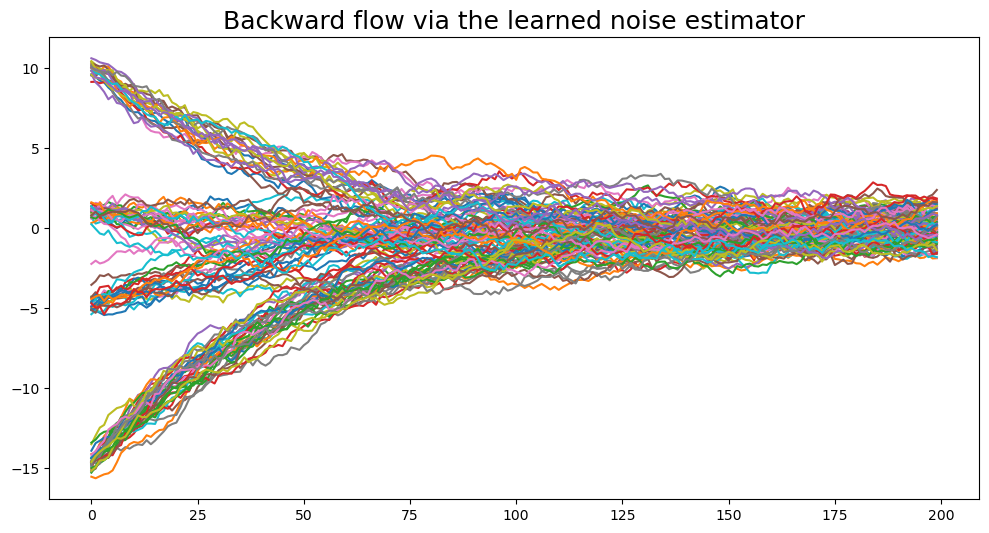

In [58]:
# backward flow
N  = 100 # num. simulated particles
d  = 1 # data dim
x0 = torch.randn(N,d)
Xb = torch.zeros(T,N,d)
Xb[-1] = x0

with torch.no_grad():
    for t in range(T-1,0,-1):
        z = torch.randn_like(Xb[t])
        inp = torch.cat([Xb[t],t*torch.ones(N,1)],-1) # N,d+1
        denoising_term = denoiser(inp) # N,d+1
        fac = (1-alphas[t])/(math.sqrt(1-alpha_bars[t]))
        Xb[t-1] = ( Xb[t] - fac*denoising_term ) / np.sqrt(alphas[t]) + z*sig

plt.figure(1,(12,6))
plt.plot(Xb.squeeze(-1))
plt.title('Backward flow via the learned noise estimator',fontsize=18);

Finally, we visualize what 

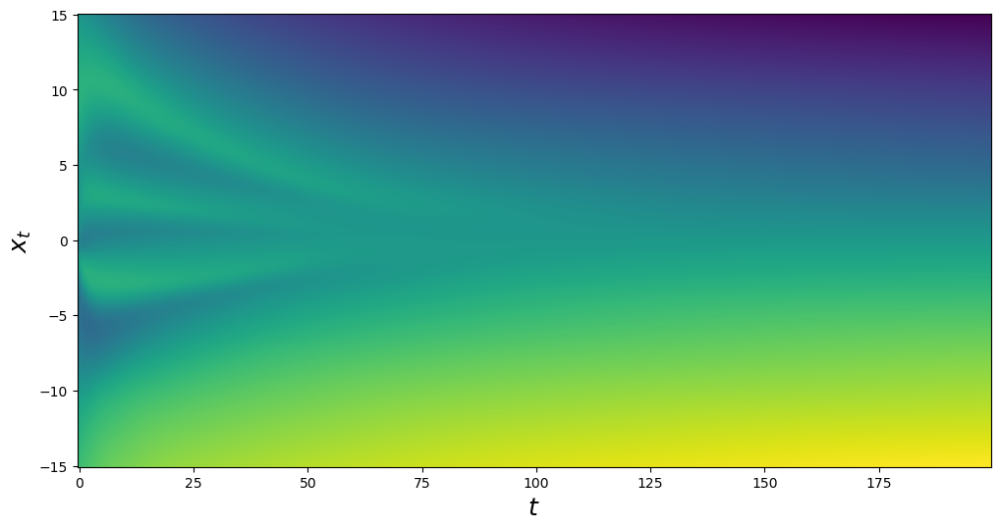

In [60]:
xs,ts = np.linspace(-15,15,200),np.arange(200)
xout,tout = np.meshgrid(xs,ts)
inps = np.stack([xout.reshape(-1),tout.reshape(-1)]).T
outs = denoiser(torch.tensor(inps,dtype=dtype)).reshape(200,200)

plt.figure(1,(12,6))
dx = (xs[1]-xs[0])/2.
dy = (ts[1]-ts[0])/2.
extent = [ts[0]-dy, ts[-1]+dy, xs[0]-dx, xs[-1]+dx]
plt.imshow(outs.detach().T, extent=extent, aspect='auto')
plt.xlabel(r'$t$',fontsize=18)
plt.ylabel(r'$x_t$',fontsize=18)
plt.title(r'Learned noise estimator $\epsilon_\theta$',fontsize=18)
plt.colorbar();

# 2. A detour on denoising basics
\begin{align}
s & \sim \mathcal{N}(s; \mu, P) & & \text{(Signal)} \\
n & \sim  \mathcal{N}(n; 0, Q) & & \text{(Noise)} \\
x & = s + n & & \text{(Noisy signal = Signal + Noise)} 
\end{align}

### 2.1. Integrating out noise
One natural way of approaching above problem is integrating out the noise to recover the true, unknown signal:
\begin{align}
p(x | s) & = \int \delta(x - s - n) p(n) dn \\
& = \int \delta(x - s - n) \mathcal{N}(n; 0, Q) dn \\
& =  \mathcal{N}(x; s, Q)
\end{align}

Joint distribution

\begin{align}
p(s, x) & = p(s) p(x| s) \\
& = \mathcal{N}(s; \mu, P) \mathcal{N}(x; s, Q) \\
&=  \mathcal{N}\left(\left(\begin{array}{c} s  \\ x  \end{array}\right);  \left(\begin{array}{c} \mu  \\ \mu  \end{array}\right), \left(\begin{array}{cc} P  & P  \\ P  & P + Q \end{array}\right)\right) 
\end{align}

since 

\begin{align}
\text{cov}(x,s)=\E{xs} - \E{x}\E{s} = \E{s^2} + \E{sn} - \E{x}\E{s} = (\mu^2+P)+0-\mu^2=P\end{align}

#### Denoising (Reversal of the direction)
Sampling from $p(s| x)$ is performed by

\begin{align}
p(s, x) =  p(x) p(s|x) &= \mathcal{N}(x; \mu, P + Q) \mathcal{N}(s; f(x), \Sigma),
\end{align}

where we have

\begin{align}
K &\equiv P (P + Q)^{-1} \\
f(x) & =  \mu + P (P + Q)^{-1} (x - \mu) = (I - K)\mu +  K x \\
\Sigma & = P - P (P + Q)^{-1}P = (I - K) P.
\end{align}

The signal $s$ is allocated a fraction of the observation by $K$ according to the prior variances $P$ and $Q$. For scalar signal and noise, the fraction is $K = P/(P + Q)$.


We can also see that: 

$I - K = I - P (P + Q)^{-1} = (P + Q)(P + Q)^{-1} - P (P + Q)^{-1} = (P+Q-P)(P + Q)^{-1} = Q (P + Q)^{-1} $

Hence, 

\begin{align}
f(x) & =  \mu + P (P + Q)^{-1} (x - \mu) \\
& = (I - P (P + Q)^{-1})\mu - Q (P + Q)^{-1}x + Q (P + Q)^{-1}x  + P (P + Q)^{-1} x  \\
& = x - Q (P + Q)^{-1}(x - \mu)
\end{align}

Equivalently:

\begin{align}
f(x) & = (I - K)\mu +  K x \\
& = Q (P + Q)^{-1} \mu + P (P + Q)^{-1} x \\
\Sigma & = (I - K) P = Q (P + Q)^{-1} P
\end{align}




### 2.2. An equivalent formulation by integrating signal
There is nothing special about $s$ and we would get exactly the same result. 
Instead of integrating out the transition noise, we can integrate out the clean signal
\begin{align}
p(x | n) & = \int \delta(x - n - s) p(s) ds \\
& = \int \delta(x - n - s) \mathcal{N}(s; \mu, P) ds \\
& = \mathcal{N}(x; \mu + n, P)
\end{align}

The joint distribution of noise and noisy signal is
\begin{align}
p(n, x) & = p(n) p(x| n) \\
& = \mathcal{N}(n; 0, Q) \mathcal{N}(x; \mu + n, P) \\
p(n, x) & = \mathcal{N}\left(\left(\begin{array}{c} n  \\ x  \end{array}\right);  \left(\begin{array}{c} 0  \\ \mu  \end{array}\right), \left(\begin{array}{cc} Q  & Q  \\ Q  & P + Q \end{array}\right)\right)
\end{align}

#### Estimating the noise (Reversal of the direction)
Sampling from $p(n| x)$
\begin{align}
p(n, x) & = p(n|x) p(x) \\
& = \mathcal{N}(n; g(x), V) \mathcal{N}(x; \mu, P + Q)  \\
g(x) & = Q (P + Q)^{-1} (x - \mu) \\
& = - \tilde{K}\mu +  \tilde{K} x \\
\tilde{K} & \equiv Q (P + Q)^{-1} \\
V & = Q - Q (P + Q)^{-1}Q = (I - \tilde{K}) Q
\end{align}

We can show the rather obvious fact, that first estimating the noise and then reconstructing the signal are equivalent to directly reconstructing the signal.
\begin{align}
p(s|x) & = \int p(s, n|x) dn = \int p(s| n, x) p(n|x) dn \\
& =  \int \delta(x - s - n) p(n|x) dn \\
& = \mathcal{N}(s; x - g(x), V) \\
\E{s|x} & = x - Q (P + Q)^{-1} (x - \mu)  \\
& = (I - Q (P + Q)^{-1}) x + Q (P + Q)^{-1} \mu \\
& = (I - Q (P + Q)^{-1}) x + Q (P + Q)^{-1} \mu + P (P + Q)^{-1} \mu - P (P + Q)^{-1} \mu \\
& = P (P + Q)^{-1} x +  (I - P (P + Q)^{-1}) \mu \\
&= Kx + (I-K) \mu \\
V & = Q - Q (P + Q)^{-1}Q \\
& = (I - Q (P + Q)^{-1})Q\\
& = P (P + Q)^{-1} Q \\
& = P (P + Q)^{-1} Q + P (P + Q)^{-1} P - P (P + Q)^{-1} P \\
& = P - P (P + Q)^{-1} P = \Sigma
\end{align}

Given $x$, we can sample
\begin{align}
n & = g(x) + \Sigma^{1/2} \epsilon \\
s & = x - n \\
& = x - g(x) + \Sigma^{1/2} (-\epsilon)
\end{align}
As $-\epsilon$ and $\epsilon$ have the identical distribution we see that generating the noise first and then the clean signal are equivalent directly sampling the signal. 

### 2.3. Tweedie's formula

In our derivation, we assumed that both the clean signal as well as the noise are Gaussian. The above formulation is actually an instance of a more general result, known as Tweedie formula (see, e.g. [Efron 2011, Tweedie's Formula and Selection Bias](https://purl.stanford.edu/wj564sy1320)), which generalizes the above denoising example to exponential family.

The minimum mean square estimate of the signal is 
\begin{align}
\E{s|x} & = x - Q (P + Q)^{-1} (x - \mu)  \\
& = x + Q \cdot \nabla_x \log p(x)
\end{align}

Here, the quantity $\nabla_x \log p(x)$ is known as the score function. We can easily verify that in the special case above, the score function is 

\begin{align}
\nabla_x \log p(x) & = \nabla_x \log \mathcal{N}(x; \mu, P + Q) \\
& = \nabla_x \left( -\frac{1}{2} \log | 2\pi (P+Q) | - \frac{1}{2} (x - \mu)^\top (P + Q)^{-1} (x - \mu) \right) \\
& = -(P + Q)^{-1} (x - \mu) 
\end{align}


### 2.4. Denoising auto-encoders

Let $p(x)$ be a data distribution. Let's assume a Gaussian noise model:

$$ s = x + \epsilon, \qquad \epsilon \sim \mathcal{N}(0,\sigma^2I).$$

Our goal is to find a function $r(\cdot)$ (e.g., NN) that takes as input a noisy data point $s$ and recover the clean data $x$. 
Mathematically, our goal is

\begin{align}
\min ~~ \mathcal{L} &= \mathbb{E}_{p(x)}\left[\mathbb{E}_{\mathcal{N}(\epsilon;0,\sigma^2I)} \left[ \|r(s)-x\|_2^2 \right] \right]  \\
&= \int p(x) \mathbb{E}_{\mathcal{N}(\epsilon;0,\sigma^2I)}\left[\|r(s)-x\|_2^2\right] dx  \\
&= \int \mathbb{E}_{\mathcal{N}(\epsilon;0,\sigma^2I)}\left[p(x) \|r(s)-x\|_2^2 \right] dx  \\
&= \int \mathbb{E}_{\mathcal{N}(\epsilon;0,\sigma^2I)}\left[p(s-\epsilon)\|r(s)-s+\epsilon\|_2^2 \right] dx
\end{align}

We differentiate the above term wrt $r$ and set it equal to 0.
Then we get:

\begin{align}
0 &= \mathbb{E}_{\mathcal{N}(\epsilon;0,\sigma^2I)}\left[p(s-\epsilon) \left( r^\star(s)-s+\epsilon \right) \right] \\
\mathbb{E}_{\mathcal{N}(\epsilon;0,\sigma^2I)}\left[p(s-\epsilon)  r^\star(s)  \right] &= \mathbb{E}_{\mathcal{N}(\epsilon;0,\sigma^2I)}\left[p(s-\epsilon) \left( s-\epsilon \right) \right] \\
r^\star(s) &= \frac{\mathbb{E}_{\mathcal{N}(\epsilon;0,\sigma^2I)}\left[p(s-\epsilon) \left( s-\epsilon \right) \right]}{\mathbb{E}_{\mathcal{N}(\epsilon;0,\sigma^2I)}\left[p(s-\epsilon) \right]} \\
r^\star(s) &= \frac{\mathbb{E}_{\mathcal{N}(\epsilon;0,\sigma^2I)}\left[p(s-\epsilon) s  \right] - \mathbb{E}_{\mathcal{N}(\epsilon;0,\sigma^2I)}\left[p(s-\epsilon) \epsilon  \right]} {\mathbb{E}_{\mathcal{N}(\epsilon;0,\sigma^2I)}\left[p(s-\epsilon) \right]}\\
r^\star(s) &= s - \frac{ \mathbb{E}_{\mathcal{N}(\epsilon;0,\sigma^2I)}\left[p(s-\epsilon) \epsilon  \right]} {\mathbb{E}_{\mathcal{N}(\epsilon;0,\sigma^2I)}\left[p(s-\epsilon) \right]}
\end{align}

Next, we re-write the density $p(s-\epsilon)$ using Taylar's expansion:

\begin{align}
p(s-\epsilon) = p(s) - \nabla p(s)^\top\epsilon + \frac{1}{2}\epsilon^\top \nabla^2p(x)\epsilon + o(\epsilon^2)
\end{align}

The expectations in the nominator 

\begin{align}
\mathbb{E}_{\mathcal{N}(\epsilon;0,\sigma^2I)}\left[p(s-\epsilon) \epsilon  \right] &= \mathbb{E}_\epsilon \left[ p(s)\epsilon - \nabla p(s)^\top\epsilon + \frac{1}{2}\epsilon^\top \nabla^2p(x)\epsilon + o(\epsilon^2) \right] \\
&= -\mathbb{E}_\epsilon [\epsilon \epsilon^\top] \nabla p(s) + o(\epsilon^2) \\
&= -\sigma^2 \nabla p(s) + o(\epsilon^2)
\end{align}

and the denominator becomes

\begin{align}
\mathbb{E}_{\mathcal{N}(\epsilon;0,\sigma^2I)}\left[p(s-\epsilon) \right] &= \mathbb{E}_\epsilon \left[ p(s) - \nabla p(s)^\top\epsilon + \frac{1}{2}\epsilon^\top \nabla^2 p(x)\epsilon + o(\epsilon^2)\right] \\
&= p(s) + O(\epsilon^2).
\end{align}

Plugging these terms in,

\begin{align}
r^\star(s) &= s - \frac{ \mathbb{E}_{\mathcal{N}(\epsilon;0,\sigma^2I)}\left[p(s-\epsilon) \epsilon  \right]} {\mathbb{E}_{\mathcal{N}(\epsilon;0,\sigma^2I)}\left[p(s-\epsilon) \right]} \\
&= s - \frac{\sigma^2 \nabla p(s) + o(\epsilon^2)}{p(s) + O(\epsilon^2)} \\
&= s + \sigma^2 \nabla \log p(s)
\end{align}

# 3. Diffusion models are SDEs

$\newcommand{\Dt}{\Delta t}$
$\newcommand{\B}{\text{B}}$

As shown in Section 1, diffusion models simply simulate the following Markov chain:

\begin{align}
x_{t+1} & = \alpha_t x_{t} + \sqrt{1 - \alpha_t^2} \N(0,I) \\
& = \sqrt{1-\beta_t} x_{t} + \sqrt{\beta_t} \N(0,I), \qquad \alpha_t^2 \equiv 1-\beta_t \\
& = \sqrt{1-\beta(t)\Dt} x_{t} + \sqrt{\beta(t)\Dt} \N(0,I), \qquad \beta_t \equiv \beta(t)\Dt
\end{align}

Let's consider the Taylor expansion of the first square root $f(\Dt) = \sqrt{1-\beta(t)\Dt}$ around $\Dt=0$:

\begin{align}
     f(\Dt) &\approx f(0) + \left.\frac{df}{d\Dt}\right|_{\Dt=0=0}\Dt \\
    \sqrt{1-\beta(t)\Dt} &\approx 1 - \left.\frac{\beta(t)}{2\sqrt{1-\beta(t)\Dt}}\right|_{\Dt=0}\Dt = 1 - \frac{\beta(t)\Dt}{2}
\end{align}

which leads to the following state difference equation:

\begin{align}
    x_{t+1} &= x_t - \frac{\beta(t)\Dt}{2} x_{t} + \sqrt{\beta(t)\Dt} \N(0,I) \\
    x_{t+1}-x_t &= - \frac{\beta(t)\Dt}{2} x_{t} + \sqrt{\beta(t)\Dt} \N(0,I).
\end{align}

In the limit $\Dt \rightarrow 0$, we obtain a stochastic differential equation:

\begin{align}
    dx_t &= - \frac{\beta(t)\Dt}{2} x_{t} + \sqrt{\beta(t)} \N(0,\sqrt{\Dt}) \\
    dx_t &= - \frac{\beta(t)\Dt}{2} x_{t} + \sqrt{\beta(t)} w_t \\
    \frac{dx_t}{dt} &= - \frac{\beta(t)}{2} x_{t} + \sqrt{\beta(t)} d\B_t \\
\end{align}

where $w_t$ and $\B_t$ are the Wiener process and Brownian motion, i.e., $\frac{d\B_t}{dt}=w(t)$.

#### Wiener process
Wiener process is also referred to as white noise, meaning $w_t$ and $w_s$ are independent whenever $t\neq s$.
Its mean and covariance are hence as follows:

\begin{align}
    \E{w_t} &= 0 \\ 
    \text{Cov}[w(t),w(s)] &= \delta(t-s)I.
\end{align}


#### Brownian motion
Brownian motion $\B(t)$ is characterised by the following properties:

- Starts at the origin $\B(0) = 0$
- Gaussian increments: $\B(t+\Dt)-\B(t) \sim \N(0,\Dt)$
- Independent increments: $\B(t+\Dt)-\B(t)$ is independent of $B(<t)$ and $B(>t+\Dt)$.

Let's see what Wiener process and Brownian motion look like.

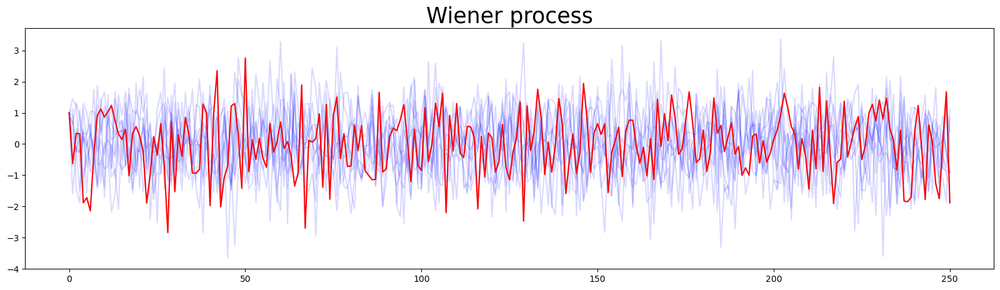

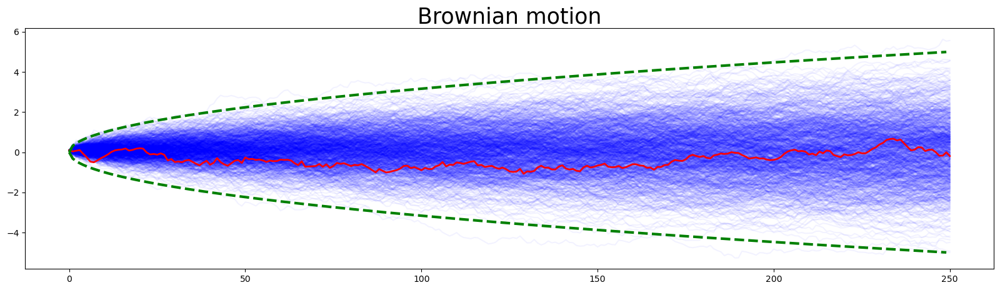

In [7]:
dt = 1e-1 # time increments
N  = 1000  # number of motion samples
T  = 250 # number of "steps"

# Wiener process
plt.figure(1,(20,5))
W = np.random.randn(N,T)
W = np.concatenate([np.ones([N,1]),W],1)
plt.plot(W[:10].T, 'b', alpha=0.15)
plt.plot(W[:1].T, 'r')
plt.title('Wiener process', fontsize=25)

# Brownian motion
plt.figure(2,(20,5))
B = (W*dt).cumsum(1)
plt.plot(B.T, 'b', alpha=0.05)
plt.plot(B[:1].T, 'r', lw=2)
t = np.arange(T)
plt.plot(t, np.sqrt(t*dt), '--g', lw=3)
plt.plot(t, -np.sqrt(t*dt), '--g', lw=3)
plt.title('Brownian motion', fontsize=25);

## 3.1. Generating samples

So far, we have seen a procedure that starts from a complicated data distribution $p_0(x_0)$ and ends up at a standard normal $p_T(x_T)=N(0,I)$.

![](figs/diff4.png)

In order to turn this into a generative model, we simply revert the procedure.
Surprisingly, for a forward SDE 


\begin{align}
    dx_t &= f(x_t,t)\Dt + g(t)dw_t \\
    dx_t &= -\frac{\beta(t)}{2} x_{t} \Dt + \sqrt{\beta(t)} w_t 
\end{align}

the backward process is also described by an SDE:

\begin{align}
    dx_t &= [f(x_t,t) - g^2(t)\nabla_x \log p_t(x_t)]\Dt + g(t)dw_t \\
    dx_t &= \left[-\frac{\beta(t)}{2} x_{t} - \beta(t)\nabla_x \log p_t(x_t)\right]\Dt + \sqrt{\beta(t)} dw_t 
\end{align}


The above SDE requires time marginals $p_t(x_t)$, which are in general not available.
On the other hand, the forward model allows us to compute $q(x_t|x_0)$.
We utilize this to compute expectation wrt $q(x_t|x_0)$:

$$ \E[q_t(x_t)]{f(x_t)} = \E[p_0(x_0)]{ \E[q_t(x_t|x_0)]{f(x_t)} }. $$

In the context of diffusion models, we approximate the score function by the following:

![](figs/diff5.png)

## 3.2. Example: the case when $p(x)$ is a mixture of Gaussians
Fisher's identity states that 
\begin{align}
    \nabla_x \log p(x) & = \frac{\nabla_x p(x)}{p(x)}.
\end{align}

<!--
For a Gaussian, we have

\begin{align}
\nabla_x \N(x; \mu^c, \Sigma^c) & =  \N(x; \mu^c, \Sigma^c) \cdot \nabla_x \log \N(x; \mu^c, \Sigma^c)  \\
& = \N(x; \mu^c, \Sigma^c) \cdot (\Sigma^c)^{-1} (\mu^c - x)  
\end{align}
-->

We first note that all marginals are mixtures

\begin{align}
    p(x) & = \sum_c w_c \N(x; \mu^c, \Sigma^c),
\end{align}

with gradients defined as follows:

\begin{align}
    \nabla_x p(x) & = \sum_c w_c \nabla_x \N(x; \mu^c, \Sigma^c) \\
    &= \sum_c w_c \N(x; \mu^c, \Sigma^c) ~ \nabla_x \log \N(x; \mu^c, \Sigma^c). 
\end{align}

We see now that the score is simply a weighted average 

\begin{align}
    \nabla_x \log p(x) = \frac{\nabla_x p(x)}{p(x)} & = \sum_c \frac{ w_c \N(x; \mu^c, \Sigma^c) }{\sum_{c'} w_{c'} \N(x; \mu^{c'}, \Sigma^{c'})} \cdot \nabla_x \log \N(x; \mu^c, \Sigma^c)  \\
& = \sum_c \pi_c(x) \nabla_x \log \N(x; \mu^c, \Sigma^c)
\end{align}

where

\begin{align}
    \pi_c(x) &\equiv \frac{ w_c \N(x; \mu^c, \Sigma^c) }{\sum_{c'} w_{c'} \N(x; \mu^{c'}, \Sigma^{c'})} \\
    \nabla_x \log \N(x; \mu^c, \Sigma^c) &= (\Sigma^c)^{-1} (\mu^c - x) 
\end{align}

#### With fixed update factor $\alpha$

The marginal we obtained previously is

$$q(x_t| x_0) = \N(a^t x_{0}, 1 - a^{2t}).$$

More explicitly, for each mixture component $c$, the density and score are as follows:

\begin{align}
  q_t^{(c)}(x_t|x_0) &= \N(x_t; \alpha^t x_0^{(c)}, 1 - \alpha^{2t}) \\
  \nabla_{x} \log q_t^{(c)}(x|x_0) &= \frac{\alpha^t x_0^{(c)}-x}{1 - \alpha^{2t}}
\end{align} 

Let's implement the backward flow.

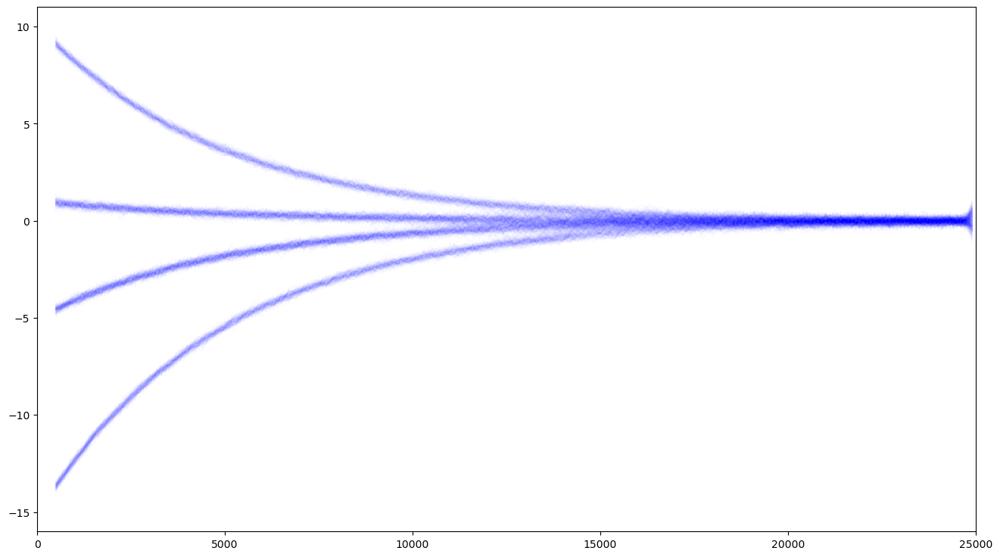

In [8]:
marg_means = np.array(mu_0).reshape(-1,1) @ a**(np.arange(T)).reshape(1,-1) # N,T
marg_vars  = np.stack([1 - a**(2*np.ones(T))]*len(mu_0)) # N,T

def score_fnc(t,x_samps):
    mu,v = marg_means[:,t],marg_vars[:,t] # [N],[N]
    N,M  = len(mu),len(x_samps)
    x_samps_ = np.stack([x_samps]*N) # N,M
    v,mu = v.reshape(N,1), mu.reshape(N,1)
    dens = np.exp(-0.5*(x_samps_ - mu)**2/v) / np.sqrt(2*np.pi*v)  # N,M
    pi = dens / dens.sum(0,keepdims=True) # N,M
    grad_log_N = (mu-x_samps_) / v # N,M
    return pi*grad_log_N # N,M


# x_grid = np.linspace(-16, 16, 3201) 
# fig,axs = plt.subplots(1,10,figsize=(20,2))
# for t in range(10):
#     pi_grad_log_N = score_fnc(t*100+10, x_grid)
#     axs[t].plot(x_grid,pi_grad_log_N.T,'--')

Nsamp = 500
dt    = 0.01
Tstep = int(T/dt)
X     = np.zeros([Tstep,Nsamp])
X[-1] = np.random.randn(Nsamp)
for t in range(Tstep-1,0,-1):
    score = score_fnc(int(t*dt),X[t]).sum(0) # Nsamp
    drift = beta * (-X[t]/2 - score)
    diffusion = np.random.randn(Nsamp)*np.sqrt(beta)
    X[t-1] = X[t] + (-dt)*drift + np.sqrt(dt)*diffusion
    
# plt.plot(np.arange(T), X[::int(1/dt),:],'-b',alpha=5/Nsamp);



fig, ax = plt.subplots(figsize=(16,9))
PLOT_EVERY = 5
T_STEP     = Tstep

def animate(t):
    ax.cla()
    t_end = int(Tstep)
    t_beg = int(Tstep - t*PLOT_EVERY//dt)
    t_plot = t*PLOT_EVERY
    ax.plot(np.arange(t_beg,t_end,int(1/dt)), X[t_beg:t_end:int(1/dt),:],'-b',alpha=5/Nsamp);
    ax.set_xlim([0,Tstep])
    ax.set_ylim([min(mu_0)-1,max(mu_0)+1])

anim = FuncAnimation(fig, animate, frames=T//PLOT_EVERY, interval=50)
HTML(anim.to_jshtml())
    

Later, the authors use the fact that the following SDE and ODE systems have the same marginal densities $\{p_t\}_{t=0}^T$

\begin{align}
    dx_t &= f(x_t,t)dt + g(t)dw_t \\
    \frac{dx_t}{dt} &= f(x_t,t) - \frac{g(t)^2}{2} \nabla_x \log p_t(x_t).
\end{align}

Hence, the following backward SDE and corresponding ODE:


\begin{align}
    dx_t &= \left[-\frac{\beta(t)}{2} x_{t} - \beta(t)\nabla_x \log p_t(x_t)\right]\Dt + \sqrt{\beta(t)} dw_t  \\
    \frac{dx_t}{dt} &= \frac{\beta(t)}{2} \left(-x_{t} - \nabla_x \log p_t(x_t) \right)
\end{align}

This SDE to ODE conversion enables
- use of advanced ODE solvers
- deterministic encoding and generation
- log-likelihood computation (continuous change of variables).

Therefore, diffusion models can be considered as continuous-time normalizing flows trained with score matching!

Let's implement the ODE flow.

torch.Size([199, 100])


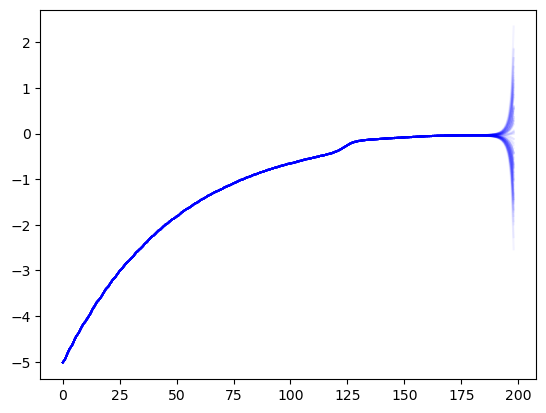

In [304]:
from torchdiffeq import odeint

Nsamp = 100
dt = 1.0
x0 = torch.randn([Nsamp,1]) # N,1
ts = torch.arange(T-dt,0,-dt)
def odef(t,x):
    score = score_fnc(min(T,int(t)),x.squeeze(-1)).sum(0)
    score = torch.tensor(score).unsqueeze(-1)
    return beta * (-x - score)
X = odeint(odef, x0, ts, method='dopri5', rtol=1e-3, atol=1e-6).squeeze(-1) # T,Nsammp 
print(X.shape)
plt.plot(X[::int(1/dt),:].flip(0),'-b',alpha=5/Nsamp);

Before concluding, we note that diffusion models directly learn energy gradient along entire diffusion process, and avoid modeling partition function. 
Different noise levels along diffusion are analogous to annealed sampling in EBMs.
An energy-based model aims to learn

$$ p_\theta(x,t) = \frac{\exp(-E_\theta(x,t))}{Z_\theta(t)}$$

where $Z_\theta(t)$ is a difficult to compute partition function. 
Having learned $E_\theta(x,t)$, one can follow the Langevin dynamics to sample from the induced posterior:

$$ x_{i+1} = x_i - \eta \nabla_x E_\theta(x_i,t) + \sqrt{2\eta}\N(0,I) $$

Diffusion models, instead of $E_\theta(x,t)$, directly learn the score gradient:

$$ s_\theta(x,t)  \approx \nabla_x \log p_\theta(x,t) = -\nabla_x E_\theta(x,t) - \underbrace{\nabla_x \log Z_\theta(t)}_{0} =  -\nabla_x E_\theta(x,t)   $$

# Appendix

### A.1.Matrix Inversion Lemma 

$$\left(\begin{array}{cc} \Sigma_{1} & \Sigma_{12}\\\Sigma_{21} & \Sigma_{2} \end{array}\right)^{-1} = \left(\begin{array}{cc} \left( \Sigma_{1} - \Sigma_{12} \Sigma_{2}^{-1} \Sigma_{21} \right)^{-1} & -  \left( \Sigma_{1} - \Sigma_{12} \Sigma_{2}^{-1} \Sigma_{21} \right)^{-1} \Sigma_{12} \Sigma_{2}^{-1} \\ - \Sigma_{2}^{-1} \Sigma_{21} \left( \Sigma_{1} - \Sigma_{12} \Sigma_{2}^{-1} \Sigma_{21} \right)^{-1}  & \Sigma_{2}^{-1} + \Sigma_{2}^{-1} \Sigma_{21} \left(\Sigma_{1} - \Sigma_{12} \Sigma_{2}^{-1} \Sigma_{21} \right)^{-1} \Sigma_{12} \Sigma_{2}^{-1}  \end{array}\right) = \left(\begin{array}{cc} \Sigma_{1}^{-1} + \Sigma_{1}^{-1} \Sigma_{12} \left(\Sigma_{2} - \Sigma_{21} \Sigma_{1}^{-1} \Sigma_{12} \right)^{-1} \Sigma_{21} \Sigma_{1}^{-1}  & - \Sigma_{1}^{-1} \Sigma_{12} \left( \Sigma_{2} - \Sigma_{21} \Sigma_{1}^{-1} \Sigma_{12} \right)^{-1}  \\ -  \left( \Sigma_{2} - \Sigma_{21} \Sigma_{1}^{-1} \Sigma_{12} \right)^{-1} \Sigma_{21} \Sigma_{1}^{-1} & \left( \Sigma_{2} - \Sigma_{21} \Sigma_{1}^{-1} \Sigma_{12} \right)^{-1} \end{array}\right)$$


### A.2.Factorization of a Gaussian joint distribution.
\begin{align}
p(x_1, x_2) & = p(x_1 | x_2) p(x_2) \\
& = p(x_2| x_1) p(x_1)
\end{align}

\begin{align}
\mathcal{N}\left( \left(\begin{array}{c} x_1  \\ x_2  \end{array}\right);  \left(\begin{array}{c} \mu_1  \\ \mu_2  \end{array}\right), \left(\begin{array}{cc} \Sigma_1  & \Sigma_{12}  \\ \Sigma_{12}^\top  & \Sigma_2 \end{array}\right)  \right) & = \mathcal{N}(x_1; \mu_1 + \Sigma_{12} \Sigma_{2}^{-1} (x_2 - \mu_2), \Sigma_1 - \Sigma_{12} \Sigma_{2}^{-1} \Sigma_{12}^\top ) \mathcal{N}(x_2; \mu_2, \Sigma_2) \\
& = \mathcal{N}(x_1; \mu_1, \Sigma_1) \mathcal{N}(x_2; \mu_2 + \Sigma_{12}^T \Sigma_{1}^{-1} (x_1 - \mu_1), \Sigma_2 - \Sigma_{12}^T \Sigma_{1}^{-1} \Sigma_{12} ) 
\end{align}
